<div style="color:#FF1F26;
           display:fill;
           border-style: solid;
           border-color:#C1C1C1;
           font-size:16px;
           font-family:Calibri;
           background-color:#B75351;">
<h2 style="text-align: center;
           padding: 10px;
           color:#FFFFFF;">
======= Introduction To Transfear Learning | Keras =======
</h2>
</div>

<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700"> Table of Contents</div>

<a id="toc"></a>
- [1. Setup](#1)
    - [1.1. Package and Library](#1.1)
    - [1.2. Load the Data](#1.2)
- [2. Data Explorations](#2)
- [3. Image Processing](#3)
- [4. Spliting](#4)
- [5. Transfear Learning](#5)
- [6. Evaluation](#6)
- [7. Predected Images](#7)



# <a id="1"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">1. Setup</div>

<a id="1.1"></a>
# <b><span style='color:#8D6D9B'>1.1. Package and Library</span></b>

In [1]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import cv2
import tensorflow as tf
import os
import random 
from tqdm import tqdm
from keras.models import Sequential
from sklearn.model_selection import train_test_split
from sklearn.metrics import classification_report , confusion_matrix
from keras.layers import Conv2D, MaxPooling2D , BatchNormalization ,Dropout ,Flatten , Dense , Input
from tensorflow.keras.models import Model
from tensorflow.keras.applications import VGG16 , InceptionV3

import warnings

with warnings.catch_warnings():
    warnings.simplefilter("ignore")
    
plt.style.use('ggplot')

pd.set_option('future.no_silent_downcasting', True)

<a id="1.2"></a>
# <b><span style='color:#8D6D9B'>1.2. Load The Data</span></b>

In [2]:
trainTestDir = ['/kaggle/input/intel-image-classification/seg_test/seg_test' , '/kaggle/input/intel-image-classification/seg_train/seg_train']
selectedClasses = ['buildings', 'forest', 'glacier', 'mountain', 'sea', 'street']

In [3]:
imgPaths = []
labels = []
for dataDir in trainTestDir:   # concatinate both train & test data
    for className in os.listdir(dataDir):
        if className in selectedClasses :                   # Select num of classes which you want
            classPath = os.path.join(dataDir,className)
            for i,img in enumerate(os.listdir(classPath)):
                imgPath = os.path.join(classPath,img)
                imgPaths.append(imgPath)
                labels.append(className)
            
# Convert the 2 lists to dataframe to easy use 
df = pd.DataFrame({
    'imgPath':imgPaths,
    'label':labels
})

df

,imgPath,label
0,/kaggle/input/intel-image-classification/seg_t...,mountain
1,/kaggle/input/intel-image-classification/seg_t...,mountain
2,/kaggle/input/intel-image-classification/seg_t...,mountain
3,/kaggle/input/intel-image-classification/seg_t...,mountain
4,/kaggle/input/intel-image-classification/seg_t...,mountain
...,...,...
17029,/kaggle/input/intel-image-classification/seg_t...,glacier
17030,/kaggle/input/intel-image-classification/seg_t...,glacier
17031,/kaggle/input/intel-image-classification/seg_t...,glacier
17032,/kaggle/input/intel-image-classification/seg_t...,glacier


We have concatenated both train and test data to avoid data leakage , and we have encoded the target value 

data leakage : some data exist in the testing data but don't exist in the training data , or vice versa  

# <a id="2"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">2. Data Explorations</div>
            

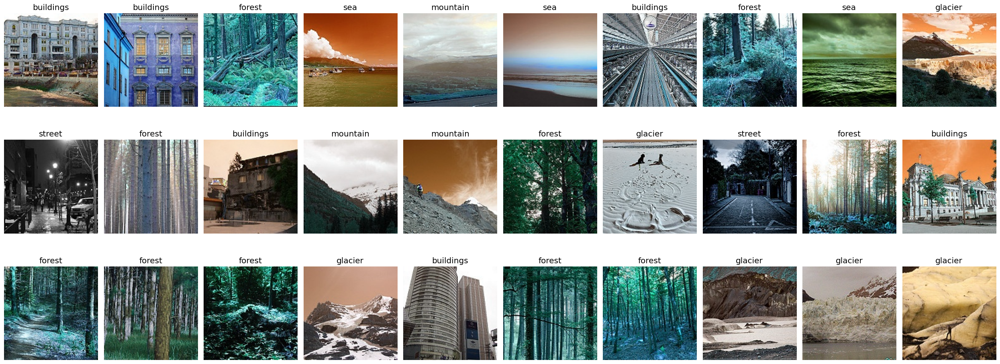

In [4]:
fig, axs = plt.subplots(3, 10, figsize=(25, 10))  # 3 rows, 5 columns

axs = axs.flatten()

for i in range(30):
    index = random.choice(df.index)
    imgPath = df.iloc[index]['imgPath']
    label = df.iloc[index]['label']
    img = cv2.imread(imgPath)
    axs[i].imshow(img)
    axs[i].set_title(label)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="3"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">3. Image Processing</div>

In [5]:
# Encode the labels 
df['label'] = df['label'].replace({'buildings':0 ,'forest':1 ,'glacier':2 ,'mountain':3 ,'sea':4 ,'street':5})

/tmp/ipykernel_82/198568090.py:2: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  df['label'] = df['label'].replace({'buildings':0 ,'forest':1 ,'glacier':2 ,'mountain':3 ,'sea':4 ,'street':5})


In [6]:
IMG_SIZE = (150,150)
imgs = []
for imgPath in tqdm(df['imgPath'], total=len(df)):
    img = cv2.imread(imgPath)
    img = cv2.cvtColor(img,cv2.COLOR_BGR2RGB)       # RGB color 
    img = cv2.resize(img,IMG_SIZE)                  # Reshape to unified shape
    imgs.append(img)

100%|██████████| 17034/17034 [01:36<00:00, 175.81it/s]


We can see that images have different shapes , so we need to reshape them to unified shape (150,150)

In [7]:
imgs[0].shape

(150, 150, 3)

In [8]:
# convert them to numpy array to we can split them 
images = np.array(imgs)
labels = np.array(df['label'])

In [9]:
len(images) , len(labels)

(17034, 17034)

In [10]:
 images = images / 255.0         # normalize from 0 --> 255 to 0 --> 1  to reduce the execution time 

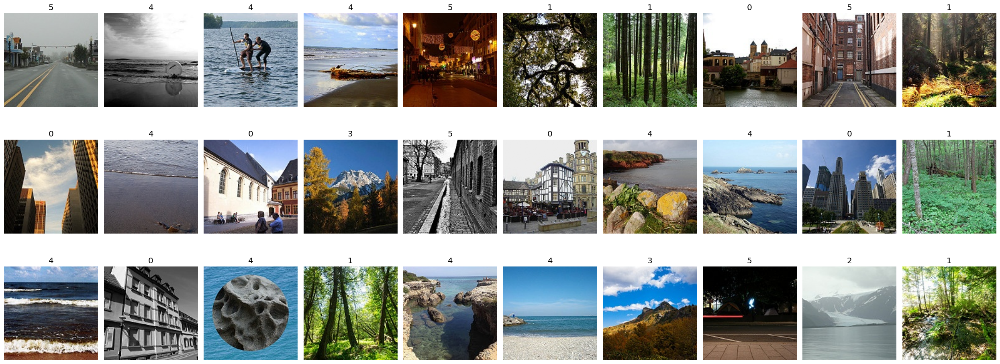

In [11]:
fig, axs = plt.subplots(3, 10, figsize=(25, 10))

axs = axs.flatten()

for i in range(30):
    index = random.choice(np.arange(len(images)))
    img = images[index]
    label = labels[index]
    axs[i].imshow(img)
    axs[i].set_title(label)
    axs[i].axis('off')
    
plt.tight_layout()
plt.show()

# <a id="4"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">4. Spliting</div>

In [12]:
X_train, X_test, y_train, y_test = train_test_split(images, labels, test_size=0.3, random_state=42 ,shuffle=True)

print(f'Shape of X_train : {X_train.shape}')
print(f'Shape of X_test : {X_test.shape}')
print(f'Shape of y_train : {y_train.shape}')
print(f'Shape of y_test : {y_test.shape}')

Shape of X_train : (11923, 150, 150, 3)
Shape of X_test : (5111, 150, 150, 3)
Shape of y_train : (11923,)
Shape of y_test : (5111,)


# <a id="5"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">5. Transfear Learning</div>

In [13]:
custom_input = Input(shape=(150, 150, 3))           # To customize the input shape of PreTrained model  

with tf.device('/GPU:0'):          # to use GPU
    Model = Sequential([

        VGG16(weights='imagenet', include_top=False, input_tensor=custom_input),

        Flatten(),                                     # because we ignore the flatten and dense layers when include_top = False 
        
        Dense(128,activation='relu'),
        
        Dropout(0.2),

        Dense(6 ,activation='softmax')
    ])

58889256/58889256 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


In [14]:
VGG16Layers = Model.layers[0]
for layer in VGG16Layers.layers[1:-3]:           # freez all layers except the first and last 3 layers, we will make them trainable (weghts changes with training)
    layer.trainable = False

In [15]:
Model.compile(optimizer='adam',loss='sparse_categorical_crossentropy' ,metrics=['accuracy'])

In [16]:
history = Model.fit(X_train,y_train,
                         validation_split = 0.2 , #validation_data=(X_test,y_test),
                         epochs=20,
                         batch_size=50, 
                         verbose=1,
                         callbacks=[tf.keras.callbacks.EarlyStopping(
                                            patience=6,
                                            monitor='val_accuracy',
                                            restore_best_weights=True)])

Epoch 1/20


I0000 00:00:1725834723.692668     132 service.cc:145] XLA service 0x7bf7d400edd0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1725834723.693729     132 service.cc:153]   StreamExecutor device (0): Tesla P100-PCIE-16GB, Compute Capability 6.0


  2/191 ━━━━━━━━━━━━━━━━━━━━ 13s 72ms/step - accuracy: 0.2150 - loss: 2.1486 

I0000 00:00:1725834732.983215     132 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


191/191 ━━━━━━━━━━━━━━━━━━━━ 40s 152ms/step - accuracy: 0.6930 - loss: 0.8052 - val_accuracy: 0.8839 - val_loss: 0.3759
Epoch 2/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.8825 - loss: 0.3379 - val_accuracy: 0.8939 - val_loss: 0.3135
Epoch 3/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9057 - loss: 0.2659 - val_accuracy: 0.9057 - val_loss: 0.2794
Epoch 4/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9230 - loss: 0.2208 - val_accuracy: 0.9044 - val_loss: 0.2851
Epoch 5/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9327 - loss: 0.1931 - val_accuracy: 0.9119 - val_loss: 0.2836
Epoch 6/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9388 - loss: 0.1839 - val_accuracy: 0.9052 - val_loss: 0.3292
Epoch 7/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9499 - loss: 0.1437 - val_accuracy: 0.9006 - val_loss: 0.3689
Epoch 8/20
191/191 ━━━━━━━━━━━━━━━━━━━━ 16s 84ms/step - accuracy: 0.9490 - loss: 0.1442 - val_accura

In [17]:
Model.summary()

Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ vgg16 (Functional)              │ (None, 4, 4, 512)      │    14,714,688 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 8192)           │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 128)            │     1,048,704 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 128)            │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 6)              │           774 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 27,302,356 (104.15 MB)

 Trainable params: 5,769,094 (22.01 MB)

 Non-trainable params: 9,995,072 (38.13 MB)

 Optimizer params: 11,538,190 (44.01 MB)

In [18]:
y_pred = Model.predict(X_test)

160/160 ━━━━━━━━━━━━━━━━━━━━ 13s 52ms/step


In [19]:
print(f'Prediction items : \n{y_pred[:5]}')

Prediction items : 
[[1.0258198e-02 2.6660837e-05 1.6190561e-03 8.4736777e-05 9.8779881e-01
  2.1258843e-04]
 [4.9241853e-04 3.4167369e-09 1.9755027e-09 5.8096488e-09 8.1183643e-08
  9.9950743e-01]
 [2.4175810e-07 2.3667205e-07 2.5425679e-03 2.4328067e-05 9.9743265e-01
  3.2199353e-08]
 [5.3150477e-05 9.9715722e-01 2.6347891e-03 1.8696832e-05 8.5000302e-06
  1.2767389e-04]
 [2.7761154e-04 2.2533432e-05 1.4583733e-02 9.8474008e-01 3.7420078e-04
  1.7049833e-06]]


In [20]:
print(f'Prediction items after rounding :  \n{np.round(y_pred[:5])}')

Prediction items after rounding :  
[[0. 0. 0. 0. 1. 0.]
 [0. 0. 0. 0. 0. 1.]
 [0. 0. 0. 0. 1. 0.]
 [0. 1. 0. 0. 0. 0.]
 [0. 0. 0. 1. 0. 0.]]


# <a id="6"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">6. Evaluation</div>

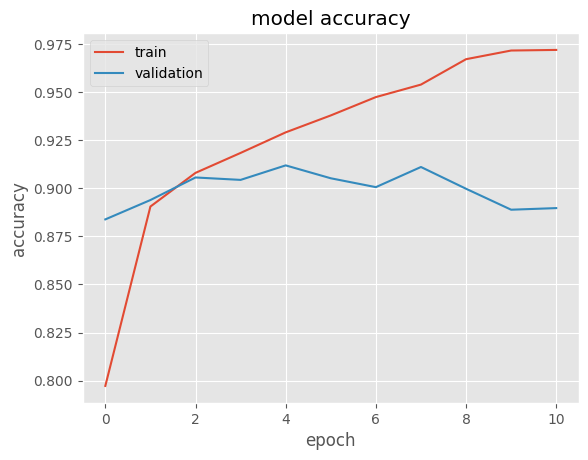

In [21]:
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('model accuracy')
plt.ylabel('accuracy')
plt.xlabel('epoch')
plt.legend(['train', 'validation'], loc='upper left')
plt.show()

In [22]:
y_test[:10]

array([4, 5, 4, 1, 3, 3, 3, 2, 4, 0])

In [23]:
new_y_pred = [np.argmax(x) for x in y_pred]
new_y_pred[:10]

[4, 5, 4, 1, 3, 3, 3, 2, 4, 0]

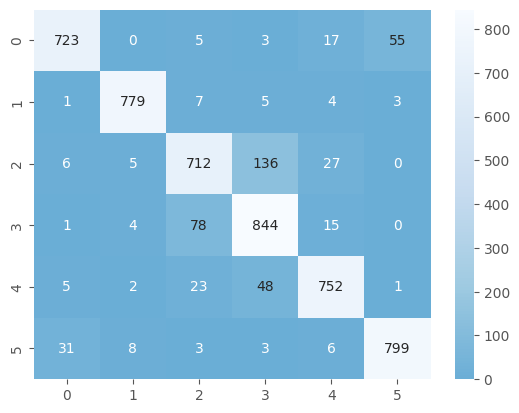

In [24]:
CM = confusion_matrix(y_test, new_y_pred)
sns.heatmap(CM, center = True,cmap='Blues_r',annot=True ,fmt='.5g')
plt.show()

In [25]:
ClassificationReport = classification_report(y_test,new_y_pred)
print('Classification Report is : \n', ClassificationReport )

Classification Report is : 
               precision    recall  f1-score   support

           0       0.94      0.90      0.92       803
           1       0.98      0.97      0.98       799
           2       0.86      0.80      0.83       886
           3       0.81      0.90      0.85       942
           4       0.92      0.90      0.91       831
           5       0.93      0.94      0.94       850

    accuracy                           0.90      5111
   macro avg       0.91      0.90      0.90      5111
weighted avg       0.90      0.90      0.90      5111



# <a id="7"></a>
<div style="padding:10px;
            color:white;
            margin:5;
            font-size:170%;
            text-align:left;
            display:fill;
            border-radius:15px;
            background-color:#294B8E;
            overflow:hidden;
            font-weight:700">7. Predected Images</div>

In [26]:
classNames = {0: 'buildings', 1: 'forest', 2: 'glacier', 3: 'mountain', 4: 'sea', 5: 'street'}

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 798ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 18ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 16ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 24ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 17ms/step


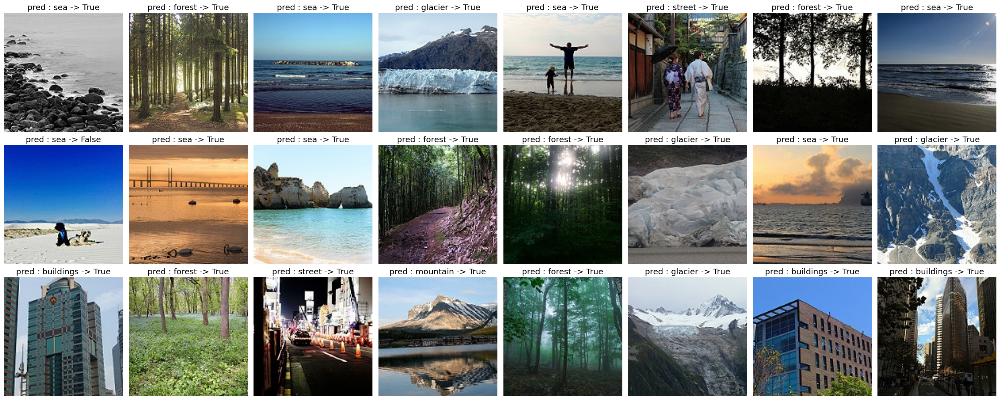

In [27]:
# Plot some images after encoding and resizing 
fig, axs = plt.subplots(3, 8, figsize=(25, 10))

axs = axs.flatten()

for i in range(24):
    index = random.choice(range(len(X_test)))
    img = X_test[index]
    label = y_test[index]
    reshapedImg = img.reshape(1,150,150,3)               # because we will predect only one iamge each time
    pred = np.argmax(Model.predict(reshapedImg))
    isPredectedTrue = 'True' if (label == pred) else 'False'
    axs[i].imshow(img)
    axs[i].set_title(f'pred : {classNames[pred]} -> {isPredectedTrue}')
    axs[i].axis('off')
    
plt.tight_layout()
plt.subplots_adjust(hspace=0.1)
plt.show()

### If these kernels impress you,give them an <font size="+3" color="red"><b>Upvote</b></font>.<br>

<a href="#toc" class="btn btn-success btn-lg active" role="button" aria-pressed="true" style="color:white" data-toggle="popover" title="go to Colors">Go to TOP</a>